-----------------------------------------------------------------------------   **Image Segmentation for 'CT Heart' dataset**    ------------------------------------------------------------------------------

Importing dataset into coolab and unzip it

In [ ]:
!pip install kaggle

In [2]:
 !mkdir ~/.kaggle

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [4]:
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/

In [ ]:
import os

os.system("chmod 600 ~/.kaggle/kaggle.json")

! kaggle datasets download -d nikhilroxtomar/ct-heart-segmentation

In [ ]:
!unzip ct-heart-segmentation.zip

**Importing libraries and packages**

In [ ]:
!pip install pydicom

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from pathlib import Path
import cv2 as cv
import os
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
import pydicom as dicom
from glob import glob
from tqdm import tqdm


our dataset has train folder and test folder, The train folder has 19 folder each of them contain images folder and masks folder, And the test folder include images in dcm.

# Get the data

In [27]:
path =Path('/content/data')

In [28]:
def data_load(directory):
    images = []
    masks = []
    for subdir in os.listdir(directory):
        img_folder = os.path.join(directory,subdir,'image')
        mask_folder = os.path.join(directory, subdir, 'mask')

        for file in os.listdir(img_folder):
            img_path = os.path.join(img_folder, file)
            img = cv.imread(img_path, cv.IMREAD_GRAYSCALE)
            images.append(img)

        for file in os.listdir(mask_folder):
            mask_path = os.path.join(mask_folder, file)
            mask = cv.imread(mask_path,cv.IMREAD_GRAYSCALE)
            masks.append(mask)

    return np.array(images), np.array(masks)

In [29]:
X_images, y_images = data_load(path/'train')

In [30]:
X_reshaped = np.resize(X_images,(X_images.shape[0],224,224))  # from (2532,512,512) to (2532,224,224)
y_reshaped = np.resize(y_images,(y_images.shape[0],224,224))  # from (2532,512,512) to (2532,224,224)

In [31]:
X_reshaped = X_reshaped.astype(np.float32) / 255  # Normalization
y_reshaped = y_reshaped.astype(np.float32) / 255

In [32]:

X_reshaped = np.expand_dims(X_reshaped, -1)  # (2532,224,224) to (2532,224,224,1)
y_reshaped = np.expand_dims(y_reshaped, -1)

In [33]:
assert X_reshaped.shape == y_reshaped.shape  # (2532,224,224) to (2532,224,224,1)
X_reshaped.shape , y_reshaped.shape

((2532, 224, 224, 1), (2532, 224, 224, 1))

# U-net Architecture

In [34]:
def conv_block(input_layer, num_filters):
    #first layer
    Z = tf.keras.layers.Conv2D(num_filters, kernel_size=3, padding='same',use_bias=False, kernel_initializer='he_uniform')(input_layer)
    Z = tf.keras.layers.BatchNormalization()(Z)
    Z = tf.keras.layers.Activation('relu')(Z)
    # second layer
    Z = tf.keras.layers.Conv2D(num_filters, kernel_size=3, padding='same',use_bias=False, kernel_initializer='he_uniform')(Z)
    Z = tf.keras.layers.BatchNormalization()(Z)
    Z = tf.keras.layers.Activation('relu')(Z)

    return Z


def encoder_block(input_layer, num_filters):
    Z = conv_block(input_layer,num_filters)
    p = tf.keras.layers.MaxPooling2D(strides=2)(Z)
    return Z, p

def decoder_block(input_layer,skip_features,num_filters):
    Z = tf.keras.layers.Conv2DTranspose(num_filters, kernel_size=3, padding='same',strides=2)(input_layer)
    Z = tf.keras.layers.Concatenate()([Z, skip_features])
    Z = conv_block(Z, num_filters)
    return Z

def build_unit(input_shape):
    # encoder side
    inputs = tf.keras.layers.Input(shape=input_shape)
    s1, p1 = encoder_block(inputs, 32)
    s2, p2 = encoder_block(p1, 64)
    s3, p3 = encoder_block(p2, 128)
    s4, p4 = encoder_block(p3, 256)

    # bottleneck
    bottleneck = conv_block(p4, 512)

    # decoder sided
    d1 = decoder_block(bottleneck, s4, 256)
    d2 = decoder_block(d1, s3, 128)
    d3 = decoder_block(d2, s2, 64)
    d4 = decoder_block(d3, s1, 32)

    # converting from 32 filter to 1
    outputs = tf.keras.layers.Conv2D(1, 1, padding="same", activation="sigmoid")(d4)
    model = tf.keras.Model(inputs, outputs)
    return model

# IoU metric

In [35]:
def iou(y_true, y_pred, smooth=1e-5):
    intersection = tf.reduce_sum(y_true * y_pred, axis=[1,2,3])
    union = tf.reduce_sum(y_true, axis=[1,2,3]) + tf.reduce_sum(y_pred, axis=[1,2,3]) - intersection
    iou = tf.reduce_mean((intersection + smooth) / (union + smooth), axis=0)
    return iou

# build the model

In [36]:
model = build_unit((X_reshaped.shape[1],X_reshaped.shape[2],1))

In [37]:
model.compile(loss='binary_crossentropy', metrics=[iou], optimizer=tf.keras.optimizers.AdamW(0.1))

In [38]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 1)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 224, 224, 32)         288       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 224, 224, 32)         128       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 224, 224, 32)         0         ['batch_normalization[0][0

In [39]:
model.fit(X_reshaped, y_reshaped, batch_size=32,epochs=3)

Epoch 1/3
80/80 [==============================] - 90s 575ms/step - loss: 0.1591 - iou: 0.0081
Epoch 2/3
80/80 [==============================] - 41s 516ms/step - loss: 0.1144 - iou: 0.0125
Epoch 3/3
80/80 [==============================] - 41s 516ms/step - loss: 0.1023 - iou: 0.0182


1/1 [==============================] - 5s 5s/step


(-0.5, 511.5, 511.5, -0.5)

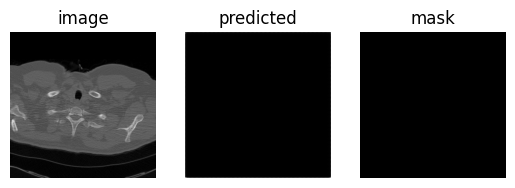

In [42]:
y_1 = model.predict(X_reshaped[:2])
plt.subplot(1,3,1)
plt.imshow(X_images[0],cmap='gray')
plt.title('image')
plt.axis('off')
plt.subplot(1,3,2)
plt.imshow(y_1[0],cmap='gray')
plt.title('predicted')
plt.axis('off')
plt.subplot(1,3,3)
plt.imshow(y_images[0],cmap='gray')
plt.title('mask')
plt.axis('off')

In [43]:
model.save('model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**preprocessing for the test images (DICOM)**

In [44]:

#""" Load the test data """
test_x = glob("data/test/*/*/*.dcm")
print(f"Test: {len(test_x)}")
#""" Loop over the data """
for x in tqdm(test_x):

#""" Extract the names """
 dir_name = x.split("/")[-3]  # making a split for the image path using / the take index 3 which is the folder name
 name = dir_name + "_" + x.split("/")[-1].split(".")[0]

#""" Read the image """
 image = dicom.dcmread(x).pixel_array
 print("the first shape",image.shape)  #512*512

 # Assuming 'image' is your image array containing pixel values
 min_val = np.min(image)
 max_val = np.max(image)

# Normalize the pixel values
 normalized_image = (image - min_val) / (max_val - min_val)

 # Clip negative values (turn all negative to zero if founded)
 normalized_image = np.clip(normalized_image, 0, 1)

 image = np.expand_dims(normalized_image, axis=-1)
 print(image.shape)  #512*512*1
 image = image*255.0   #make the pixels values between 0-255

 print('image',image[200])
 print("the final shape",image.shape)  #512*512*1
 # cv.imwrite(f"/content/new cdm images/{name}.png", image)
 #use the above line if you need to show yor dcm images into the new shape

 #now you can use any image from the test file to make predictions using model.H5




Test: 832


  1%|          | 9/832 [00:00<00:09, 88.69it/s]

the first shape (512, 512)
(512, 512, 1)
image [[100.27229846]
 [ 99.50686106]
 [ 97.10120069]
 [ 96.88250429]
 [ 98.41337907]
 [100.70969125]
 [ 99.83490566]
 [ 98.41337907]
 [101.25643225]
 [102.13121784]
 [102.24056604]
 [102.67795883]
 [104.64622642]
 [105.9584048 ]
 [103.99013722]
 [101.25643225]
 [ 97.42924528]
 [ 96.22641509]
 [ 96.99185249]
 [ 95.7890223 ]
 [ 97.86663808]
 [102.24056604]
 [104.53687822]
 [104.97427101]
 [108.69210978]
 [112.40994854]
 [113.61277873]
 [117.0025729 ]
 [119.62692967]
 [118.20540309]
 [116.5651801 ]
 [116.5651801 ]
 [115.03430532]
 [112.08190395]
 [112.84734134]
 [114.15951973]
 [112.95668954]
 [112.51929674]
 [111.64451115]
 [101.03773585]
 [ 71.84176672]
 [ 35.64751286]
 [ 18.47984563]
 [ 18.26114923]
 [ 19.68267581]
 [ 21.5415952 ]
 [ 26.13421955]
 [ 30.39879931]
 [ 30.94554031]
 [ 30.50814751]
 [ 32.58576329]
 [ 33.89794168]
 [ 30.94554031]
 [ 25.04073756]
 [ 21.6509434 ]
 [ 18.80789022]
 [ 17.49571184]
 [ 18.26114923]
 [ 19.35463122]
 [ 21.650

  2%|▏         | 19/832 [00:00<00:08, 92.40it/s]

the first shape (512, 512)
(512, 512, 1)
image [[100.85064074]
 [103.66769775]
 [103.32965091]
 [102.09014582]
 [103.21696863]
 [103.10428635]
 [103.32965091]
 [106.59743703]
 [108.06230667]
 [109.75254087]
 [108.40035351]
 [104.11842687]
 [100.96332302]
 [102.2028281 ]
 [104.34379143]
 [102.99160407]
 [ 99.9491825 ]
 [101.30136986]
 [104.56915599]
 [106.25939019]
 [107.83694211]
 [106.71011931]
 [105.47061423]
 [105.80866107]
 [105.24524967]
 [105.58329651]
 [105.69597879]
 [101.97746354]
 [104.11842687]
 [106.03402563]
 [107.94962439]
 [112.00618648]
 [113.92178524]
 [118.54175873]
 [120.90808661]
 [118.65444101]
 [113.69642068]
 [115.16129032]
 [118.31639417]
 [120.23199293]
 [120.23199293]
 [111.10472824]
 [ 81.46928856]
 [ 44.2841361 ]
 [ 25.35351304]
 [ 22.53645603]
 [ 22.19840919]
 [ 22.76182059]
 [ 20.62085727]
 [ 17.35307114]
 [ 19.38135219]
 [ 25.69155988]
 [ 27.94520548]
 [ 22.31109147]
 [ 18.47989395]
 [ 19.49403447]
 [ 20.84622183]
 [ 20.28281043]
 [ 20.62085727]
 [ 20.057

  3%|▎         | 29/832 [00:00<00:09, 82.51it/s]

Streaming output truncated to the last 5000 lines.
 [ 91.97519084]
 [ 88.3740458 ]
 [ 91.09923664]
 [ 94.99236641]
 [ 96.0629771 ]
 [ 94.21374046]
 [ 91.0019084 ]
 [ 91.19656489]
 [ 93.24045802]
 [ 97.42557252]
 [ 97.23091603]
 [ 94.11641221]
 [ 92.46183206]
 [ 94.01908397]
 [ 95.28435115]
 [ 92.85114504]
 [ 93.82442748]
 [ 94.99236641]
 [ 95.47900763]
 [ 95.28435115]
 [ 92.26717557]
 [ 93.92175573]
 [ 97.71755725]
 [ 98.98282443]
 [ 96.9389313 ]
 [ 95.28435115]
 [ 93.14312977]
 [ 89.15267176]
 [ 87.69274809]
 [ 91.8778626 ]
 [ 95.28435115]
 [ 92.94847328]
 [ 92.65648855]
 [ 95.57633588]
 [ 96.74427481]
 [ 94.60305344]
 [ 91.58587786]
 [ 93.82442748]
 [ 95.08969466]
 [ 94.21374046]
 [ 94.60305344]
 [ 94.99236641]
 [ 95.96564885]
 [ 98.10687023]
 [101.31870229]
 [102.        ]
 [103.07061069]
 [105.30916031]
 [104.53053435]
 [101.90267176]
 [102.29198473]
 [102.19465649]
 [ 96.45229008]
 [ 91.68320611]
 [ 88.17938931]
 [ 86.6221374 ]
 [ 92.07251908]
 [ 98.20419847]
 [ 99.85877863]
 [ 97

  6%|▌         | 48/832 [00:00<00:09, 86.46it/s]

Streaming output truncated to the last 5000 lines.
 [ 94.37162683]
 [ 92.89707016]
 [ 88.86661527]
 [ 84.54124904]
 [ 85.22937548]
 [ 88.67000771]
 [ 88.96491904]
 [ 89.65304549]
 [ 90.63608327]
 [ 91.42251349]
 [ 89.75134927]
 [ 87.78527371]
 [ 87.98188126]
 [ 91.12760216]
 [ 93.97841172]
 [ 95.05975328]
 [ 93.97841172]
 [ 92.20894372]
 [ 88.67000771]
 [ 89.65304549]
 [ 93.58519661]
 [ 95.8461835 ]
 [ 95.55127217]
 [ 94.86314572]
 [ 97.41904395]
 [ 99.77833462]
 [ 97.02582884]
 [ 93.1919815 ]
 [ 93.68350039]
 [ 92.79876638]
 [ 94.27332305]
 [ 95.74787972]
 [ 94.27332305]
 [ 94.37162683]
 [ 95.74787972]
 [ 92.99537394]
 [ 92.70046261]
 [ 96.53430995]
 [ 98.59868928]
 [ 98.79529684]
 [100.17154973]
 [102.43253662]
 [101.94101773]
 [100.17154973]
 [ 99.68003084]
 [ 98.59868928]
 [ 98.79529684]
 [ 99.8766384 ]
 [101.94101773]
 [104.10370085]
 [104.3003084 ]
 [106.26638396]
 [107.24942174]
 [106.95451041]
 [108.13415574]
 [108.3307633 ]
 [105.28334618]
 [103.02235929]
 [105.38164996]
 [104

  8%|▊         | 67/832 [00:00<00:08, 85.12it/s]

Streaming output truncated to the last 5000 lines.
 [ 21.38569604]
 [ 22.36270754]
 [ 24.75095785]
 [ 24.20817369]
 [ 21.16858238]
 [ 17.80332056]
 [ 17.2605364 ]
 [ 18.56321839]
 [ 21.16858238]
 [ 23.44827586]
 [ 24.09961686]
 [ 25.94508301]
 [ 31.59003831]
 [ 34.30395913]
 [ 31.80715198]
 [ 29.41890166]
 [ 25.51085568]
 [ 18.78033206]
 [ 17.5862069 ]
 [ 19.32311622]
 [ 21.16858238]
 [ 24.09961686]
 [ 25.29374202]
 [ 20.95146871]
 [ 18.99744572]
 [ 22.5798212 ]
 [ 30.72158365]
 [ 29.20178799]
 [ 19.97445722]
 [ 17.15197957]
 [ 18.67177522]
 [ 20.73435504]
 [ 25.61941252]
 [ 24.64240102]
 [ 22.9054917 ]
 [ 24.20817369]
 [ 26.37931034]
 [ 23.99106003]
 [ 20.51724138]
 [ 21.06002554]
 [ 21.38569604]
 [ 19.64878672]
 [ 20.40868455]
 [ 21.27713921]
 [ 21.38569604]
 [ 23.77394636]
 [ 28.11621967]
 [ 27.03065134]
 [ 25.40229885]
 [ 26.37931034]
 [ 28.44189017]
 [ 29.52745849]
 [ 33.32694764]
 [ 32.24137931]
 [ 30.93869732]
 [ 29.85312899]
 [ 40.27458493]
 [ 73.81864623]
 [104.64878672]
 [114

 10%|█         | 86/832 [00:01<00:08, 86.31it/s]


the final shape (512, 512, 1)
the first shape (512, 512)
(512, 512, 1)
image [[ 98.98645876]
 [ 98.35863767]
 [ 95.95199015]
 [ 94.27780057]
 [ 91.34796881]
 [ 91.34796881]
 [ 95.21953221]
 [ 95.74271645]
 [ 95.8473533 ]
 [ 96.68444809]
 [ 98.56791137]
 [ 97.10299549]
 [ 92.08042675]
 [ 92.28970045]
 [ 95.32416906]
 [ 93.12679524]
 [ 90.30160033]
 [ 93.23143209]
 [ 93.02215839]
 [ 94.69634797]
 [ 98.88182191]
 [ 99.7189167 ]
 [ 96.57981124]
 [ 94.48707427]
 [ 97.31226918]
 [ 97.20763233]
 [ 96.78908494]
 [ 97.73081658]
 [ 99.30036931]
 [ 99.30036931]
 [ 97.41690603]
 [ 97.41690603]
 [100.76528519]
 [101.70701682]
 [102.96265901]
 [102.96265901]
 [101.39310628]
 [104.95075913]
 [107.35740665]
 [103.5904801 ]
 [ 99.9281904 ]
 [103.7997538 ]
 [ 97.31226918]
 [ 65.81657776]
 [ 30.65859664]
 [ 14.75379565]
 [ 14.8584325 ]
 [ 15.48625359]
 [ 15.17234304]
 [ 16.63725892]
 [ 17.36971686]
 [ 17.78826426]
 [ 17.47435371]
 [ 19.14854329]
 [ 20.50882232]
 [ 18.62535905]
 [ 14.54452195]
 [ 16.0094

 12%|█▎        | 104/832 [00:01<00:08, 84.78it/s]

(512, 512, 1)
image [[ 60.57154439]
 [ 90.0304013 ]
 [108.01580867]
 [106.67207134]
 [ 99.74665586]
 [ 96.33563032]
 [ 94.0616133 ]
 [ 95.0952574 ]
 [ 96.43899473]
 [ 96.74908796]
 [ 93.54479124]
 [ 93.64815565]
 [ 96.54235914]
 [ 94.88852858]
 [ 91.58086745]
 [ 92.51114714]
 [ 93.33806242]
 [ 91.16740981]
 [ 89.72030807]
 [ 91.47750304]
 [ 93.95824889]
 [ 96.23226591]
 [ 96.85245237]
 [ 98.60964734]
 [ 98.71301176]
 [ 96.43899473]
 [ 98.81637617]
 [106.36197811]
 [112.56384272]
 [113.80421565]
 [110.18646129]
 [109.66963924]
 [111.22010539]
 [109.97973247]
 [109.15281719]
 [110.59991893]
 [111.53019862]
 [108.11917308]
 [102.33076611]
 [101.91730847]
 [107.08552898]
 [112.25374949]
 [113.2873936 ]
 [114.3210377 ]
 [116.07823267]
 [114.42440211]
 [112.46047831]
 [114.01094447]
 [114.3210377 ]
 [112.25374949]
 [111.01337657]
 [109.46291042]
 [111.11674098]
 [109.77300365]
 [106.87880016]
 [108.32590191]
 [111.53019862]
 [114.11430888]
 [115.66477503]
 [114.3210377 ]
 [113.59748683]
 [11

 14%|█▎        | 113/832 [00:01<00:08, 80.70it/s]

the first shape (512, 512)
(512, 512, 1)
image [[ 97.19439728]
 [102.93081494]
 [105.20373514]
 [ 98.27674024]
 [ 96.43675722]
 [100.11672326]
 [ 96.65322581]
 [ 94.70500849]
 [ 94.3803056 ]
 [ 97.62733447]
 [101.84847199]
 [100.98259762]
 [ 96.8696944 ]
 [ 94.81324278]
 [100.87436333]
 [101.74023769]
 [100.33319185]
 [ 99.46731749]
 [ 96.65322581]
 [ 97.62733447]
 [100.11672326]
 [101.74023769]
 [101.84847199]
 [ 99.79202037]
 [ 99.35908319]
 [100.22495756]
 [ 97.19439728]
 [ 98.70967742]
 [101.30730051]
 [100.54966044]
 [105.09550085]
 [116.24363328]
 [122.08828523]
 [119.49066214]
 [118.0836163 ]
 [121.87181664]
 [121.11417657]
 [114.72835314]
 [114.18718166]
 [124.57767402]
 [140.81281834]
 [153.04329372]
 [156.18208829]
 [150.87860781]
 [146.65747029]
 [145.46689304]
 [150.98684211]
 [153.4762309 ]
 [139.1893039 ]
 [118.51655348]
 [108.23429542]
 [ 91.45797963]
 [ 55.95713073]
 [ 28.14091681]
 [ 16.88455008]
 [ 16.01867572]
 [ 17.10101868]
 [ 16.34337861]
 [ 15.69397284]
 [ 15.802

 16%|█▌        | 130/832 [00:01<00:09, 71.78it/s]

 (512, 512)
(512, 512, 1)
image [[ 94.11319251]
 [ 96.24750897]
 [ 91.06416899]
 [ 91.87724193]
 [ 95.43443603]
 [ 90.55599841]
 [ 87.81187724]
 [ 94.21482662]
 [ 97.97528896]
 [ 96.34914308]
 [ 92.69031487]
 [ 91.16580311]
 [ 90.96253487]
 [ 90.55599841]
 [ 93.70665604]
 [ 95.8409725 ]
 [ 94.62136309]
 [ 93.80829016]
 [ 94.31646074]
 [ 96.4507772 ]
 [ 93.70665604]
 [ 89.9461937 ]
 [ 90.55599841]
 [ 93.40175369]
 [ 96.24750897]
 [ 95.53607015]
 [ 94.62136309]
 [ 91.26743723]
 [ 88.21841371]
 [ 87.40534077]
 [ 86.28736548]
 [ 86.69390195]
 [ 89.64129135]
 [ 91.77560781]
 [ 93.60502192]
 [ 93.80829016]
 [ 92.79194898]
 [ 91.16580311]
 [ 90.86090076]
 [ 87.71024312]
 [ 88.11677959]
 [ 90.86090076]
 [ 94.82463133]
 [ 98.7883619 ]
 [ 96.4507772 ]
 [ 94.41809486]
 [ 92.58868075]
 [ 93.60502192]
 [ 92.48704663]
 [ 88.21841371]
 [ 89.336389  ]
 [ 92.18214428]
 [ 93.40175369]
 [ 95.2311678 ]
 [ 98.99163013]
 [101.7357513 ]
 [101.32921483]
 [103.15862894]
 [109.15504185]
 [110.67955361]
 [107.93

 17%|█▋        | 145/832 [00:01<00:10, 67.62it/s]

[[111.80037313]
 [106.32929104]
 [108.35121269]
 [107.63759328]
 [103.47481343]
 [104.90205224]
 [104.78311567]
 [104.18843284]
 [110.61100746]
 [119.53125   ]
 [122.14785448]
 [124.16977612]
 [119.8880597 ]
 [123.21828358]
 [126.54850746]
 [123.09934701]
 [126.90531716]
 [129.99766791]
 [127.1431903 ]
 [129.40298507]
 [127.73787313]
 [132.97108209]
 [129.04617537]
 [122.62360075]
 [118.69869403]
 [128.68936567]
 [126.4295709 ]
 [122.62360075]
 [122.38572761]
 [125.00233209]
 [126.19169776]
 [127.38106343]
 [128.45149254]
 [132.49533582]
 [130.71128731]
 [126.31063433]
 [124.76445896]
 [128.5704291 ]
 [133.44682836]
 [125.59701493]
 [120.12593284]
 [125.00233209]
 [124.16977612]
 [124.64552239]
 [126.90531716]
 [128.33255597]
 [120.00699627]
 [111.9193097 ]
 [120.2448694 ]
 [127.38106343]
 [116.20102612]
 [126.31063433]
 [125.83488806]
 [122.86147388]
 [121.90998134]
 [124.64552239]
 [119.65018657]
 [114.53591418]
 [120.72061567]
 [116.79570896]
 [120.95848881]
 [126.54850746]
 [125.24

 18%|█▊        | 152/832 [00:02<00:11, 60.74it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 15.91786448]
 [ 32.04517454]
 [ 60.11088296]
 [ 82.83572895]
 [100.95277207]
 [102.94250513]
 [ 99.1724846 ]
 [ 98.85831622]
 [ 95.19301848]
 [ 93.30800821]
 [ 95.71663244]
 [ 96.86858316]
 [ 93.20328542]
 [ 95.71663244]
 [101.05749487]
 [ 98.54414784]
 [ 93.09856263]
 [ 91.31827515]
 [ 96.76386037]
 [ 98.02053388]
 [ 93.93634497]
 [ 94.25051335]
 [ 93.62217659]
 [ 94.35523614]
 [ 93.30800821]
 [ 93.93634497]
 [ 96.65913758]
 [ 94.66940452]
 [ 94.66940452]
 [ 93.5174538 ]
 [ 91.63244353]
 [ 91.73716632]
 [ 96.24024641]
 [ 95.50718686]
 [ 96.97330595]
 [ 94.77412731]
 [ 97.7063655 ]
 [ 98.22997947]
 [ 98.75359343]
 [ 96.97330595]
 [ 95.50718686]
 [ 92.47022587]
 [ 93.83162218]
 [ 95.40246407]
 [ 96.44969199]
 [ 94.14579055]
 [ 93.30800821]
 [ 95.29774127]
 [ 95.71663244]
 [ 94.66940452]
 [ 96.76386037]
 [ 95.40246407]
 [ 93.5174538 ]
 [ 91.31827515]
 [ 93.20

 20%|█▉        | 166/832 [00:02<00:11, 60.38it/s]

(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 14.15596677]
 [ 25.90445619]
 [ 38.71223565]
 [ 51.6163142 ]
 [ 68.46865559]
 [ 83.29871601]
 [ 87.15067976]
 [ 89.17296073]
 [ 88.20996979]
 [ 88.40256798]
 [ 85.51359517]
 [ 86.18768882]
 [ 85.32099698]
 [ 86.09138973]
 [ 84.16540785]
 [ 84.06910876]
 [ 85.99509063]
 [ 89.94335347]
 [ 90.71374622]
 [ 87.34327795]
 [ 88.69146526]
 [ 84.26170695]
 [ 82.04682779]
 [ 81.9505287 ]
 [ 83.87651057]
 [ 86.95808157]
 [ 87.72847432]
 [ 85.70619335]
 [ 89.46185801]
 [ 86.86178248]
 [ 8

 22%|██▏       | 180/832 [00:02<00:10, 63.19it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [ 12.52858958]
 [ 10.58449809]
 [  6.58831004]
 [  7.88437103]
 [ 16.52477764]
 [ 32.2935197 ]
 [ 58.64675985]
 [ 86.29606099]
 [107.46505718]
 [110.38119441]
 [105.52096569]
 [101.20076239]
 [100.76874206]
 [ 96.44853875]
 [100.76874206]
 [ 97.20457433]
 [ 94.9364676 ]
 [ 96.98856417]
 [ 98.93265565]
 [ 99.9047014 ]
 [ 96.23252859]
 [ 98.93265565]
 [ 97.31257942]
 [ 96.55654384]
 [ 94.61245235]
 [ 96.44853875]
 [ 97.4205845 ]
 [ 98.93265565]
 [ 99.04066074]
 [ 97.96060991]
 [ 98.28462516]
 [ 95.58449809]
 [ 95.04447268]
 [ 96.66454892]
 [ 96.88055909]
 [ 96.98856417]
 [ 98.17662008]
 [ 98.28462516]
 [ 97.74459975]
 [ 97.20457433]
 [102.82083863]
 [104.11689962]
 [101.52477764]
 [100.33672173]
 [ 98.17662008]
 [ 94.07242694]
 [ 99.36467598]
 [100.66073698]
 [ 97.85260483]
 [ 97.63659466]
 [ 95.80050826]
 [ 96.66454892]
 [ 98.17662008]
 [ 98.39263024]
 [ 99.36467598]
 [100.22871665]
 [ 99.040

 23%|██▎       | 195/832 [00:02<00:09, 64.33it/s]

[[ 64.27007299]
 [102.91970803]
 [115.51094891]
 [110.80291971]
 [105.87591241]
 [101.27737226]
 [ 98.21167883]
 [ 95.58394161]
 [ 95.91240876]
 [100.51094891]
 [102.59124088]
 [104.34306569]
 [105.        ]
 [105.54744526]
 [103.79562044]
 [109.27007299]
 [115.0729927 ]
 [118.57664234]
 [119.01459854]
 [119.5620438 ]
 [112.22627737]
 [114.52554745]
 [123.06569343]
 [147.59124088]
 [155.3649635 ]
 [144.30656934]
 [131.60583942]
 [122.40875912]
 [119.01459854]
 [118.24817518]
 [118.02919708]
 [115.2919708 ]
 [128.10218978]
 [142.99270073]
 [141.67883212]
 [127.44525547]
 [121.31386861]
 [112.66423358]
 [113.86861314]
 [115.72992701]
 [113.75912409]
 [111.78832117]
 [112.55474453]
 [113.21167883]
 [113.75912409]
 [109.05109489]
 [111.02189781]
 [112.33576642]
 [112.88321168]
 [118.57664234]
 [117.59124088]
 [122.73722628]
 [117.15328467]
 [111.35036496]
 [110.1459854 ]
 [114.52554745]
 [119.34306569]
 [119.45255474]
 [120.76642336]
 [115.2919708 ]
 [113.10218978]
 [111.45985401]
 [107.40

 25%|██▌       | 209/832 [00:02<00:09, 66.03it/s]


the final shape (512, 512, 1)
the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 17.1997389 ]
 [ 44.0535248 ]
 [ 77.34334204]
 [107.96997389]
 [115.5156658 ]
 [113.96214099]
 [106.41644909]
 [102.64360313]
 [101.53394256]
 [100.09138381]
 [100.97911227]
 [101.31201044]
 [101.20104439]
 [ 96.54046997]
 [102.75456919]
 [100.86814621]
 [100.53524804]
 [100.53524804]
 [100.09138381]
 [ 97.98302872]
 [100.31331593]
 [ 98.98172324]
 [100.09138381]
 [ 98.53785901]
 [103.53133159]
 [100.42428198]
 [103.53133159]
 [101.31201044]
 [102.1997389 ]
 [100.6462141 ]
 [ 98.20496084]
 [ 96.76240209]
 [ 97.53916449]
 [ 98.75979112]
 [ 98.53785901]
 [ 95.54177546]
 [100.75718016]
 [ 98.75979112]
 [ 98.31592689]
 [101.64490862]
 [100.20234987]
 [101.4229765 ]
 [101.75587467]
 [ 96.87336815]
 [100.97911227]
 [ 99.31462141]
 [ 95.20887728]
 [100.6462141 ]
 [ 99.8694517 ]
 [ 99.20365535]
 [ 98.42689295]
 [ 99.31462141]
 [ 99.6475

 27%|██▋       | 225/832 [00:03<00:08, 70.06it/s]

[[126.91833942]
 [122.96304745]
 [113.54014599]
 [106.32755474]
 [105.16423358]
 [105.16423358]
 [103.41925182]
 [106.90921533]
 [109.23585766]
 [109.4685219 ]
 [107.25821168]
 [107.14187956]
 [104.46624088]
 [105.39689781]
 [110.39917883]
 [107.83987226]
 [105.16423358]
 [103.41925182]
 [103.88458029]
 [103.53558394]
 [108.18886861]
 [106.67655109]
 [103.65191606]
 [103.88458029]
 [107.02554745]
 [110.51551095]
 [115.0524635 ]
 [121.33439781]
 [117.49543796]
 [124.47536496]
 [127.73266423]
 [121.79972628]
 [122.84671533]
 [125.63868613]
 [123.42837591]
 [134.94525547]
 [160.53832117]
 [170.89187956]
 [161.35264599]
 [138.20255474]
 [128.54698905]
 [127.38366788]
 [130.05930657]
 [142.50684307]
 [155.76870438]
 [165.42427007]
 [149.13777372]
 [106.44388686]
 [ 53.62910584]
 [ 25.94206204]
 [ 16.6354927 ]
 [ 14.5415146 ]
 [ 15.12317518]
 [ 16.05383212]
 [ 14.5415146 ]
 [  8.95757299]
 [  7.79425182]
 [  9.65556569]
 [  8.72490876]
 [ 11.7495438 ]
 [ 15.70483577]
 [ 11.98220803]
 [ 10.12

 28%|██▊       | 233/832 [00:03<00:08, 68.98it/s]

[[110.66037736]
 [117.48573936]
 [112.22685388]
 [105.62527424]
 [103.16366828]
 [103.16366828]
 [103.16366828]
 [107.07985959]
 [104.50636244]
 [103.94690654]
 [106.18473014]
 [106.96796841]
 [114.35278631]
 [120.28301887]
 [117.70952172]
 [119.38788943]
 [116.7025011 ]
 [114.12900395]
 [114.35278631]
 [114.12900395]
 [115.58358929]
 [120.17112769]
 [125.09433962]
 [127.77972795]
 [130.24133392]
 [134.82887231]
 [136.6191312 ]
 [135.38832821]
 [130.57700746]
 [132.81483107]
 [132.70293989]
 [138.52128126]
 [137.40236946]
 [134.04563405]
 [136.73102238]
 [128.00351031]
 [122.74462484]
 [123.75164546]
 [122.63273366]
 [121.40193067]
 [120.28301887]
 [119.61167179]
 [122.52084247]
 [125.54190434]
 [117.261957  ]
 [111.33172444]
 [118.04519526]
 [122.18516893]
 [115.91926283]
 [117.03817464]
 [113.34576569]
 [109.65335674]
 [121.06625713]
 [120.05923651]
 [125.31812198]
 [117.03817464]
 [114.12900395]
 [114.24089513]
 [105.73716542]
 [107.97498903]
 [109.20579201]
 [116.81439228]
 [115.80

 30%|██▉       | 247/832 [00:03<00:09, 64.00it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 13.73808537]
 [ 14.05511811]
 [ 25.46829673]
 [ 40.58019063]
 [ 61.61002901]
 [ 80.20928305]
 [ 99.97099047]
 [108.00248653]
 [102.4015748 ]
 [101.8731869 ]
 [ 95.53253212]
 [ 96.27227518]
 [ 98.06879403]
 [ 96.27227518]
 [ 97.32905097]
 [ 95.84956486]
 [ 97.32905097]
 [ 95.1098218 ]
 [ 95.6382097 ]
 [ 96.06092002]
 [ 95.6382097 ]
 [ 95.1098218 ]
 [ 98.28014919]
 [ 96.27227518]
 [ 94.79278906]
 [ 94.89846664]
 [ 97.22337339]
 [ 93.20762536]
 [ 92.9962702 ]
 [ 93.73601326]
 [ 93.63033568]
 [ 94.15872358]
 [ 94.053046  ]
 [ 96.06092002]
 [ 94.89846664]
 [ 94.37007874]
 [ 95.53253212]
 [ 93.20762536]
 [ 94.68711148]
 [ 92.78491504]
 [ 95.95524244]
 [ 93.94736842]
 [ 94.68711148]
 [ 95.95524244]
 [ 96.58930792]
 [ 99.86531289]
 [100.60505595]
 [ 95.32117696]
 [ 98.91421467]
 [ 96.906

 31%|███▏      | 261/832 [00:03<00:09, 62.30it/s]


the final shape (512, 512, 1)
the first shape (512, 512)
(512, 512, 1)
image [[103.57857143]
 [124.1       ]
 [128.83571429]
 [119.36428571]
 [111.59285714]
 [107.58571429]
 [109.16428571]
 [109.16428571]
 [111.71428571]
 [109.52857143]
 [110.13571429]
 [111.22857143]
 [110.62142857]
 [110.62142857]
 [108.43571429]
 [107.82857143]
 [111.22857143]
 [111.59285714]
 [105.88571429]
 [109.04285714]
 [112.68571429]
 [107.70714286]
 [110.13571429]
 [108.8       ]
 [111.35      ]
 [110.25714286]
 [105.64285714]
 [111.22857143]
 [114.02142857]
 [109.89285714]
 [110.98571429]
 [113.05      ]
 [108.19285714]
 [108.67857143]
 [106.97857143]
 [107.82857143]
 [112.68571429]
 [113.17142857]
 [106.12857143]
 [106.12857143]
 [105.64285714]
 [108.31428571]
 [107.34285714]
 [109.89285714]
 [110.5       ]
 [109.04285714]
 [110.5       ]
 [110.62142857]
 [111.83571429]
 [111.83571429]
 [109.16428571]
 [112.56428571]
 [115.11428571]
 [123.85714286]
 [128.59285714]
 [126.40714286]
 [128.95714286]
 [134.0571

 33%|███▎      | 275/832 [00:03<00:09, 60.36it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 28.43283582]
 [ 62.68656716]
 [ 96.82835821]
 [115.07462687]
 [114.62686567]
 [111.71641791]
 [107.01492537]
 [100.97014925]
 [ 99.73880597]
 [103.76865672]
 [103.32089552]
 [102.64925373]
 [104.6641791 ]
 [100.74626866]
 [103.43283582]
 [100.74626866]
 [101.75373134]
 [103.09701493]
 [103.20895522]
 [102.98507463]
 [103.43283582]
 [ 99.40298507]
 [100.63432836]
 [102.76119403]
 [108.69402985]
 [106.90298507]
 [108.58208955]
 [104.55223881]
 [103.54477612]
 [100.29850746]
 [ 99.96268657]
 [100.52238806]
 [100.18656716]
 [ 99.29104478]
 [105.78358209]
 [102.53731343]
 [101.41791045]
 [ 96.60447761]
 [ 99.51492537]
 [104.55223881]
 [102.53731343]
 [102.53731343]
 [ 97.7238806 ]
 [ 91.67910448]
 [106.56716418]
 [103.43283582]
 [ 99.17910448]
 [102.20149254]
 [101.08208955]
 [100.18656716]
 [ 97.6119403 ]
 [102.64925373]
 [100.97014925]
 [101.19402985]
 [102.761

 35%|███▍      | 289/832 [00:04<00:08, 63.83it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 12.73820537]
 [  1.5333025 ]
 [  0.        ]
 [  0.        ]
 [  1.29740981]
 [  7.07678076]
 [  6.36910268]
 [ 29.36864015]
 [ 68.17298797]
 [110.16188714]
 [119.83348751]
 [115.46947271]
 [104.97224792]
 [105.67992599]
 [105.56197965]
 [108.39269195]
 [106.15171138]
 [108.74653099]
 [106.74144311]
 [103.79278446]
 [109.21831637]
 [103.43894542]
 [109.92599445]
 [112.16697502]
 [104.1466235 ]
 [113.22849214]
 [105.56197965]
 [106.38760407]
 [106.62349676]
 [107.80296022]
 [109.21831637]
 [101.78769658]
 [ 96.7160037 ]
 [106.26965772]
 [113.34643848]
 [114.76179463]
 [115.7053654 ]
 [119.71554117]
 [114.4079556 ]
 [112.16697502]
 [129.97687327]
 [130.68455134]
 [123.37187789]
 [122.90009251]
 [138.23311748]
 [159.46345976]
 [142.95097132]
 [126.20259019]
 [127.97178538]
 [127.38205365]
 [159.22756707]
 [164.88899167]
 [140.12025902]
 [107.331

 36%|███▌      | 296/832 [00:04<00:08, 62.82it/s]

the first shape (512, 512)
(512, 512, 1)
image [[0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [1.03785104e-01]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [1.03785104e-01]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [1.19352869e+01]
 [1.24542125e+01]
 [8.92551893e+00]
 [9.34065934e-01]

 37%|███▋      | 311/832 [00:04<00:07, 66.30it/s]

(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [ 14.30729391]
 [ 53.37721191]
 [ 90.35606388]
 [109.61588261]
 [113.35779025]
 [ 99.71083297]
 [ 96.29909366]
 [ 95.63875701]
 [ 98.39015969]
 [ 94.20802762]
 [ 93.65774709]
 [ 90.24600777]
 [ 93.43763487]
 [ 91.12645662]
 [ 93.8778593 ]
 [ 99.38066465]
 [ 99.38066465]
 [ 99.16055244]
 [107.30470436]
 [102.79240397]
 [106.53431161]
 [ 99.16055244]
 [106.3141994 ]
 [103.67285283]
 [103.34268451]
 [114.128183  ]
 [119.19076392]
 [119.52093224]
 [121.06171774]
 [114.89857574]
 [117.53992231]
 [115.66896849]
 [113.35779025]
 [120.62149331]
 [142.19249029]
 [137.23996547]
 [124.36340095]
 [123.37289599]
 [122.0522227 ]
 [134.81873112]
 [139.88131204]
 [140.10142426]
 [123.26283988]
 [118.31031506]
 [123.81312041]
 [121.94216659]
 [117.09969789]
 [106.4242555 ]
 [103.45274061]
 [111.046612  ]
 [117.98014674]
 [130.85671126]
 [130.74665516]
 [112.25722918]
 [115.88908071]
 [109.39577039]
 [108.18515322]
 [120.29132499]
 [112.80750971]
 [10

 39%|███▉      | 325/832 [00:04<00:07, 65.52it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 28.29215116]
 [ 66.22093023]
 [106.00290698]
 [121.56976744]
 [119.84011628]
 [113.16860465]
 [110.69767442]
 [109.58575581]
 [108.22674419]
 [118.85174419]
 [111.31540698]
 [115.51598837]
 [114.65116279]
 [112.79796512]
 [107.48546512]
 [107.85610465]
 [113.16860465]
 [106.25      ]
 [110.69767442]
 [108.10319767]
 [114.03343023]
 [114.89825581]
 [110.69767442]
 [111.80959302]
 [110.69767442]
 [114.28052326]
 [112.42732558]
 [109.09156977]
 [107.85610465]
 [112.30377907]
 [108.22674419]
 [113.6627907 ]
 [110.4505814 ]
 [117.49273256]
 [113.29215116]
 [112.92151163]
 [112.55087209]
 [123.2994186 ]
 [120.21075581]
 [119.22238372]
 [126.63

 41%|████      | 341/832 [00:04<00:07, 68.47it/s]


(512, 512, 1)
image [[0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [1.03629733e+01]
 [6.02292463e+00]
 [3.45432442e+00]
 [1.77144842e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [8.59152484e+00]
 [4.25147621e+00]
 [1.50573116e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [2.65717263e-01]
 [3.01146231e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [1.50573116e+00]
 [1.32858631e+00]
 [0.00000000e+00]
 [6.28864189e+00]
 [5.58006252e+00]
 [4.340

 43%|████▎     | 356/832 [00:05<00:06, 69.54it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 42.06185567]
 [ 86.27460169]
 [122.00328022]
 [125.22961575]
 [116.14807873]
 [109.09793814]
 [111.3683224 ]
 [104.55716963]
 [103.84020619]
 [107.54451734]
 [102.40627929]
 [106.82755389]
 [113.87769447]
 [109.45641987]
 [100.85285848]
 [110.53186504]
 [107.78350515]
 [105.03514527]
 [106.9470478 ]
 [109.09793814]
 [105.27413308]
 [103.48172446]
 [106.9470478 ]
 [108.3809747 ]
 [103.36223055]
 [111.96579194]
 [107.18603561]
 [108.26148079]
 [110.41237113]
 [112.20477976]
 [112.32427366]
 [115.31162137]
 [119.01593252]
 [130.84582943]
 [125.34910965]
 [135.86457357]
 [133.23570759]
 [148.41143393]
 [173.26616682]
 [177.44845361]
 [151.39878163]
 [140.04686036]
 [134.55014058]
 [137.41799438]
 [129.77038425]
 [148.88940956]
 [160.12

 44%|████▍     | 370/832 [00:05<00:07, 64.45it/s]

the first shape (512, 512)
(512, 512, 1)
image [[0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [3.22814208e+01]
 [8.96448087e+01]
 [1.27383880e+02]
 [1.29125683e+02]
 [1.22274590e+02]
 [1.01605191e+02]
 [9.39412568e+01]
 [9.71926230e+01]
 [1.07178962e+02]
 [1.07178962e+02]
 [1.07295082e+02]
 [9.57991803e+01]
 [9.60314208e+01]
 [9.95150273e+01]
 [1.02998634e+02]
 [1.14262295e+02]
 [1.04624317e+02]
 [9.73087432e+01]
 [1.04740437e+02]
 [1.00560109e+02]
 [1.09733607e+02]
 [1.11591530e+02]
 [1.12056011e+02]
 [1.10894809e+02]
 [1.09617486e+02]
 [1.14262295e+02]
 [1.16468579e+02]
 [1.20648907e+02]
 [1.24596995e+02]
 [1.16584699e+02]
 [1.26571038e+02]
 [1.64542350e+02]
 [1.74760929e+02]
 [1.41898907e+02]
 [1.28428962e+02]
 [1.23087432e+02]
 [1.32493169e+02]
 [1.59316940e+02]
 [1.69303279e+02]
 [1.46659836e+02]
 [1.11475410e+02]
 [1.16120219e+02]
 [1.10314208e+02]
 [1.04043716e+02]
 [1.16816940e+02]
 [1.14262295e+02]
 [1.10894809e+02]

 45%|████▌     | 377/832 [00:05<00:07, 60.77it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 14.11305582]
 [ 42.09791864]
 [ 87.09082308]
 [121.22753075]
 [120.74503311]
 [110.73320719]
 [106.7526017 ]
 [108.32071902]
 [106.87322611]
 [115.55818354]
 [114.23131504]
 [112.18070009]
 [109.40633869]
 [114.59318827]
 [110.73320719]
 [107.47634816]
 [108.32071902]
 [105.54635762]
 [109.28571429]
 [109.28571429]
 [112.06007569]
 [110.37133396]
 [109.40633869]
 [113.26631977]
 [106.63197729]
 [111.57757805]
 [107.11447493]
 [111.93945128]
 [110.97445601]
 [115.19631031]
 [105.90823084]
 [108.68259224]
 [112.66319773]
 [112.54257332]
 [107.47634816]
 [119.78

 47%|████▋     | 391/832 [00:05<00:07, 60.42it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [ 20.74      ]
 [ 56.89333333]
 [100.86666667]
 [118.43333333]
 [112.42666667]
 [110.04666667]
 [103.58666667]
 [108.46      ]
 [105.4       ]
 [100.64      ]
 [103.02      ]
 [101.66      ]
 [ 93.61333333]
 [ 97.80666667]
 [106.76      ]
 [104.26666667]
 [105.85333333]
 [106.19333333]
 [104.38      ]
 [105.62666667]
 [ 97.35333333]
 [105.85333333]
 [107.32666667]
 [104.60666667]
 [ 99.84666667]
 [ 98.71333333]
 [103.24666667]
 [106.08      ]
 [100.07333333]
 [101.77333333]
 [101.54666667]
 [ 96.56      ]
 [ 98.14666667]
 [114.01333333]
 [107.1       ]
 [102.56666667]
 [106.19333333]
 [105.62666667]
 [106.76      ]
 [108.46      ]
 [111.06666667]
 [102.45333333]
 [101.88666667]
 [110.95333333]
 [113.44666667]
 [ 95.54      ]
 [105.74      ]
 [103.47333333]
 [ 95.88      ]
 [ 90.55333333]
 [ 88.85333333]
 [ 99.84

 49%|████▊     | 405/832 [00:05<00:07, 60.32it/s]

the first shape (512, 512)
(512, 512, 1)
image [[0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]

 50%|█████     | 419/832 [00:06<00:06, 59.69it/s]

image [[0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [2.99882399e-01]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [9.99607997e-02]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [0.00000000e+00]
 [2.40905527e+01]
 [5.68776950e+01]
 [8.38671109e+01]
 [9.

 52%|█████▏    | 432/832 [00:06<00:06, 61.07it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [121.53701528]
 [120.75793184]
 [120.33842538]
 [120.69800235]
 [122.55581669]
 [127.05052879]
 [146.28789659]
 [166.90364277]
 [178.11045828]
 [179.84841363]
 [179.36897767]
 [177.09165687]
 [173.97532315]
 [174.21504113]
 [176.37250294]
 [173.31609871]
 [173.55581669]
 [173.97532315]
 [176.01292597]
 [174.15511163]
 [173.3760282 ]
 [175.35370153]
 [172.95652174]
 [175.41363102]
 [176.8519389 ]
 [173.79553467]
 [174.5746181 ]
 [175.7132785 ]
 [176.67215041]
 [174.87426557]
 [177.21151586]
 [176.07285546]
 [173.3760282 ]
 [173.67567568]
 [173.4359577 ]
 [174.21504113]
 [174.33490012]
 [174.27497062]
 [177.39130435]
 [177.15158637]
 [175.23384254]
 [172.71680376]
 [177.09165687]
 [177.45123384]
 [175.53349001]
 [172.05757932]
 [176.19271445]
 [177.03172738]
 [174.5746181 ]
 [176.07285546]
 [173.97532315]
 [174.21504113]
 [171.99764982]
 [175.89306698]
 [174.63454759]
 [169.60047004]
 [173.25

 53%|█████▎    | 439/832 [00:06<00:06, 59.72it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [179.53328509]
 [177.81114327]
 [181.31693198]
 [179.22575977]
 [177.07308249]
 [177.56512301]
 [180.7633864 ]
 [179.22575977]
 [178.54920405]
 [179.22575977]
 [177.74963821]
 [180.7633864 ]
 [179.53328509]
 [178.79522431]
 [177.56512301]
 [180.45586107]
 [178.48769899]
 [178.05716353]
 [178.67221418]
 [181.56295224]
 [180.14833575]
 [178.91823444]
 [180.82489146]
 [183.223589  ]
 [178.30318379]
 [179.10274964]
 [179.53328509]
 [179.84081042]
 [178.85672938]
 [178.73371925]
 [181.37843705]
 [180.14833575]
 [182.60853835]
 [178.24167873]
 [179.84081042]
 [181.93198263]
 [178.85672938]
 [178.42619392]
 [180.20984081]
 [181.19392185]
 [177.25759768]
 [178.91823444]
 [179.1642547 ]
 [178.85672938]
 [180.33285094]
 [177.50361795]
 [179.28726483]
 [185.06874096]
 [179.96382055]
 [181.31693198]
 [180.20984081]
 [178.36468886]
 [177.87264834]
 [179.10274964]
 [180.45586107]
 [179.77930535]
 [182.97

 54%|█████▍    | 451/832 [00:06<00:06, 56.02it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [115.91946309]
 [125.04697987]
 [147.06711409]
 [171.36912752]
 [176.21812081]
 [172.22483221]
 [163.83892617]
 [161.7852349 ]
 [163.4966443 ]
 [165.60738255]
 [168.23154362]
 [168.97315436]
 [164.97986577]
 [167.37583893]
 [166.00671141]
 [165.32214765]
 [164.63758389]
 [162.41275168]
 [165.43624161]
 [165.32214765]
 [166.97651007]
 [167.77516779]
 [165.55033557]
 [163.55369128]
 [164.52348993]
 [167.20469799]
 [164.52348993]
 [166.69127517]
 [170.22818792]
 [168.45973154]
 [167.66107383]
 [164.92281879]
 [168.63087248]
 [166.74832215]
 [164.80872483]
 [166.57718121]
 [164.29530201]
 [165.77852349]
 [166.86241611]
 [168.68791946]
 [169.4295302 ]
 [167.88926174]
 [166.46308725]
 [164.69463087]
 [164.18120805]
 [164.75167785]
 [167.43288591]
 [164.35234899]
 [166.17785235]
 [168.2885906 ]
 [166.17785235]
 [166.69127517]
 [169.82885906]
 [166.91946309]
 [163.78187919]
 [164.97986577]
 [168.00

 56%|█████▌    | 463/832 [00:06<00:06, 56.46it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [177.33349135]
 [175.64114719]
 [176.84996445]
 [175.58070633]
 [178.96539464]
 [176.66864186]
 [176.06423323]
 [176.06423323]
 [172.25645888]
 [176.30599668]
 [178.48186774]
 [176.72908272]
 [175.33894288]
 [176.12467409]
 [178.84451292]
 [179.63024413]
 [177.99834084]
 [169.17397488]
 [176.54776013]
 [178.90495378]
 [175.76202892]
 [177.03128703]
 [178.84451292]
 [178.90495378]
 [177.45437307]
 [175.94335151]
 [174.4927708 ]
 [179.81156672]
 [183.92154539]
 [181.02038398]
 [182.41052382]
 [186.64138421]
 [185.43256696]
 [184.40507229]
 [180.71817966]
 [180.71817966]
 [184.46551315]
 [183.86110453]
 [185.67433041]
 [200.54278265]
 [220.24650391]
 [198.60867504]
 [185.79521214]
 [181.86655606]
 [185.49300782]
 [191.83929841]
 [218.55415975]
 [230.88409576]
 [179.14671723]
 [139.61839298]
 [131.45887651]
 [128.79947855]
 [130.12917753]
 [131.277

 57%|█████▋    | 475/832 [00:07<00:06, 56.95it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [104.91368681]
 [104.80887793]
 [105.01849568]
 [105.85696671]
 [106.32860666]
 [108.2675709 ]
 [106.06658446]
 [106.27620222]
 [105.59494451]
 [105.75215783]
 [105.85696671]
 [104.80887793]
 [104.80887793]
 [104.80887793]
 [104.80887793]
 [105.75215783]
 [105.80456227]
 [107.95314427]
 [108.84401973]
 [106.80024661]
 [105.59494451]
 [108.31997534]
 [109.99691739]
 [108.00554871]
 [112.09309494]
 [121.10665845]
 [129.648582  ]
 [137.77127004]
 [147.30887793]
 [153.17817509]
 [156.6892725 ]
 [158.78545006]
 [158.26140567]
 [159.93834772]
 [161.82490752]
 [158.94266338]
 [157.94697904]
 [152.54932182]
 [152.49691739]
 [152.96855734]
 [150.97718866]
 [150.81997534]
 [153.12577065]
 [153.49260173]
 [152.75893958]
 [152.18249075]
 [154.54069051]
 [157.6325524 ]
 [157.52774353]
 [157.68495684]
 [152.96855734]
 [149.824291  ]
 [151.7108508 ]
 [154.75030826]
 [156.32244143]
 [156.84648582]
 [153.70

 59%|█████▊    | 487/832 [00:07<00:06, 57.13it/s]

(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [172.24149896]
 [169.29215822]
 [170.4129077 ]
 [172.12352533]
 [171.53365718]
 [171.12074948]
 [172.12352533]
 [171.06176266]
 [173.00832755]
 [170.70784178]
 [171.47467037]
 [172.65440666]
 [170.70784178]
 [171.17973629]
 [172.18251214]
 [172.12352533]
 [173.48022207]
 [173.42123525]
 [172.18251214]
 [172.30048577]
 [173.42123525]
 [171.94656489]
 [171.41568355]
 [172.35947259]
 [174.07009022]
 [172.12352533]
 [171.06176266]
 [173.83414296]
 [171.88757807]
 [171.65163081]
 [172.0055517 ]
 [172.35947259]
 [172.94934074]
 [172.71339348]
 [171.53365718]
 [172.4184594 ]
 [172.77238029]
 [171.23872311]
 [171.47467037]
 [173.18528799]
 [174.0111034 ]
 [174.48299792]
 [172.83136711]
 [172.94934074]
 [171.71061763]
 [172.65440666]
 [173.65718251]
 [171.12074948]
 [172.77238029]
 [173.53920888]
 [173.5981957 ]
 [174.89590562]
 [174.0111034 ]
 [171.12074948]
 [173.12630118]
 [17

 60%|█████▉    | 499/832 [00:07<00:05, 57.78it/s]

(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [171.11687414]
 [169.7648686 ]
 [170.17634855]
 [171.23443983]
 [170.88174274]
 [173.8208852 ]
 [171.70470263]
 [172.70401107]
 [167.76625173]
 [169.17704011]
 [174.46749654]
 [175.40802213]
 [176.64246196]
 [178.22959889]
 [178.64107884]
 [178.64107884]
 [178.22959889]
 [179.34647303]
 [181.10995851]
 [180.05186722]
 [181.3450899 ]
 [181.9329184 ]
 [177.28907331]
 [178.58229599]
 [184.40179806]
 [179.93430152]
 [179.40525588]
 [178.52351314]
 [176.23098202]
 [172.58644537]
 [172.46887967]
 [156.12724758]
 [132.32019364]
 [122.03319502]
 [124.20816044]
 [126.85338866]
 [124.73720609]
 [125.79529737]
 [121.44536653]
 [124.03181189]
 [127.55878285]
 [124.38450899]
 [121.15145228]
 [122.56224066]
 [125.85408022]
 [123.3264177 ]
 [119.5055325 ]
 [123.62033195]
 [133.67219917]
 [137.66943292]
 [134.37759336]
 [128.96957123]
 [126.91217151]
 [127.7351314 ]
 [128.96957123]
 [12

 62%|██████▏   | 514/832 [00:07<00:05, 63.05it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [174.44548214]
 [179.68480037]
 [174.56455755]
 [179.8634135 ]
 [175.15993463]
 [179.14896101]
 [177.83913145]
 [174.68363297]
 [180.99462993]
 [178.91081018]
 [180.93509223]
 [185.22180714]
 [191.23511557]
 [185.04319402]
 [178.97034789]
 [186.11487275]
 [191.77095494]
 [178.91081018]
 [177.72005604]
 [173.37380341]
 [178.61312164]
 [174.80270838]
 [171.23044595]
 [180.39925286]
 [178.55358394]
 [187.66285314]
 [205.76231613]
 [190.46112538]
 [192.12818118]
 [191.35419099]
 [179.02988559]
 [179.44664954]
 [182.95937427]
 [180.6969414 ]
 [183.13798739]
 [175.04085921]
 [180.93509223]
 [190.34204996]
 [181.35185618]
 [177.66051833]
 [177.4223675 ]
 [180.51832827]
 [182.60214803]
 [190.81835162]
 [185.75764651]
 [178.01774457]
 [177.18421667]
 [183.55475134]
 [180.33971515]
 [176.76745272]
 [180.33971515]
 [177.77959374]
 [181.76862013]
 [180.756

 64%|██████▎   | 529/832 [00:08<00:04, 66.35it/s]


image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [106.07321131]
 [106.07321131]
 [106.07321131]
 [106.07321131]
 [106.07321131]
 [106.07321131]
 [106.07321131]
 [106.28535774]
 [106.07321131]
 [106.07321131]
 [107.61127288]
 [108.45985857]
 [106.39143095]
 [106.23232113]
 [107.8234193 ]
 [110.21006656]
 [111.42990849]
 [112.91493344]
 [117.90037438]
 [129.09109817]
 [141.07737105]
 [150.73003328]
 [157.5187188 ]
 [159.79929285]
 [158.57945092]
 [158.57945092]
 [159.48107321]
 [158.84463394]
 [157.30657238]
 [156.98835275]
 [156.35191348]
 [154.38955907]
 [155.13207155]
 [155.87458403]
 [156.29887687]
 [156.82924293]
 [156.61709651]
 [157.04138935]
 [156.98835275]
 [156.5640599 ]
 [154.91992512]
 [154.7077787 ]
 [154.81385191]
 [155.55636439]
 [154.60170549]
 [155.07903494]
 [155.29118136]
 [153.27579035]
 [152.95757072]
 [152.69238769]
 [152.74542429]
 [153.70008319]
 [154.86688852]
 [154.38955907]
 [153.80615641]
 [153.11668053]
 

 65%|██████▌   | 544/832 [00:08<00:04, 68.80it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [122.06797511]
 [124.38726663]
 [125.66898037]
 [141.11057922]
 [159.90904739]
 [179.86716132]
 [185.3602202 ]
 [184.3836764 ]
 [180.29439923]
 [180.29439923]
 [179.92819531]
 [180.53853518]
 [175.65581618]
 [177.97510771]
 [177.24269986]
 [175.35064624]
 [175.65581618]
 [180.66060316]
 [176.02202011]
 [176.81546194]
 [174.67927238]
 [175.89995213]
 [176.20512207]
 [176.93752992]
 [178.21924366]
 [175.5337482 ]
 [176.44925802]
 [177.97510771]
 [176.51029201]
 [178.64648157]
 [179.56199138]
 [178.64648157]
 [176.32719004]
 [179.07371948]
 [176.38822403]
 [177.85303973]
 [179.19578746]
 [178.70751556]
 [178.70751556]
 [179.62302537]
 [178.46337961]
 [176.87649593]
 [178.70751556]
 [177.97510771]
 [175.77788416]
 [174.61823839]
 [177.05959789]
 [176.81546194]
 [175.35064624]
 [180.9657731 ]
 [174.31306845]
 [176.51029201]
 [179.43992341]
 [176.876

 67%|██████▋   | 559/832 [00:08<00:03, 68.37it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [168.90885751]
 [167.3267009 ]
 [165.74454429]
 [164.2169448 ]
 [163.83504493]
 [164.2169448 ]
 [164.32605905]
 [163.88960205]
 [163.07124519]
 [162.96213094]
 [164.27150193]
 [165.63543004]
 [166.72657253]
 [167.76315789]
 [169.29075738]
 [170.05455712]
 [170.436457  ]
 [171.30937099]
 [171.85494223]
 [170.54557125]
 [168.58151476]
 [167.05391528]
 [166.18100128]
 [166.34467266]
 [167.21758665]
 [167.81771502]
 [167.87227214]
 [167.43581515]
 [168.96341463]
 [170.81835687]
 [171.63671374]
 [170.65468549]
 [169.7817715 ]
 [169.01797176]
 [167.21758665]
 [165.19897304]
 [164.6534018 ]
 [165.47175866]
 [166.29011553]
 [166.29011553]
 [164.54428755]
 [163.88960205]
 [164.6534018 ]
 [165.41720154]
 [165.36264442]
 [165.41720154]
 [164.48973042]
 [163.7804878 ]
 [164.2169448 ]
 [166.07188703]
 [167.76315789]
 [168.09050064]
 [166.99935815]
 [165.52631579]
 [164.38061617]
 [163.18035944]
 [162.47

 69%|██████▉   | 573/832 [00:08<00:03, 68.61it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [172.20412234]
 [173.61702128]
 [173.89960106]
 [173.78656915]
 [173.61702128]
 [173.50398936]
 [173.84308511]
 [174.40824468]
 [174.80385638]
 [177.1775266 ]
 [189.72406915]
 [205.88763298]
 [204.98337766]
 [191.30651596]
 [182.4900266 ]
 [180.625     ]
 [180.2293883 ]
 [182.37699468]
 [195.54521277]
 [217.86901596]
 [229.28523936]
 [211.65226064]
 [173.16489362]
 [141.79853723]
 [129.81715426]
 [127.83909574]
 [127.04787234]
 [125.6349734 ]
 [124.61768617]
 [124.27859043]
 [124.56117021]
 [125.35239362]
 [125.46542553]
 [124.56117021]
 [123.76994681]
 [123.93949468]
 [123.88297872]
 [123.31781915]
 [123.20478723]
 [122.63962766]
 [121.00066489]
 [120.88763298]
 [122.9787234 ]
 [124.50465426]
 [124.16555851]
 [123.71343085]
 [123.65691489]
 [122.5831117 ]
 [121.7918883 ]
 [122.41356383]
 [123.31781915]
 [123.71343085]
 [123.71343085]
 [123.54388298]
 [123.31781915]
 [123.43085106]
 [124.10

 71%|███████   | 588/832 [00:08<00:03, 67.93it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [170.17477724]
 [168.48526388]
 [168.66004112]
 [169.30089102]
 [168.60178204]
 [168.77655929]
 [169.82522276]
 [170.75736806]
 [171.74777245]
 [170.87388622]
 [170.29129541]
 [171.10692255]
 [170.87388622]
 [170.52433173]
 [172.03906785]
 [173.26250857]
 [172.50514051]
 [171.16518163]
 [172.15558602]
 [172.91295408]
 [173.02947224]
 [174.66072653]
 [176.23372173]
 [177.22412611]
 [181.82659356]
 [189.16723783]
 [194.52707334]
 [197.44002742]
 [198.89650446]
 [196.91569568]
 [192.13845099]
 [189.98286498]
 [193.59492803]
 [202.56682659]
 [206.81973955]
 [193.42015079]
 [167.90267306]
 [147.33721727]
 [138.7148732 ]
 [136.55928718]
 [133.76285127]
 [130.20904729]
 [130.15078821]
 [134.69499657]
 [141.68608636]
 [145.41466758]
 [140.34612748]
 [130.73337903]
 [124.73269363]
 [123.62577108]
 [123.97532557]
 [123.91706648]
 [123.62577108]
 [123.917

 72%|███████▏  | 603/832 [00:09<00:03, 68.81it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [162.55760369]
 [162.27781435]
 [162.66951942]
 [163.95655036]
 [164.9078341 ]
 [164.68400263]
 [163.73271889]
 [163.34101382]
 [163.11718236]
 [162.55760369]
 [162.55760369]
 [163.17314022]
 [163.95655036]
 [163.9005925 ]
 [163.22909809]
 [162.83739302]
 [163.34101382]
 [162.78143515]
 [162.05398288]
 [162.78143515]
 [163.67676103]
 [163.78867676]
 [163.84463463]
 [164.4042133 ]
 [163.78867676]
 [162.66951942]
 [162.72547729]
 [163.67676103]
 [165.18762344]
 [167.87360105]
 [170.5036208 ]
 [170.89532587]
 [171.23107307]
 [172.63001975]
 [176.0994075 ]
 [183.20605662]
 [188.01843318]
 [184.71691903]
 [177.44239631]
 [173.63726136]
 [176.26728111]
 [182.64647795]
 [185.33245556]
 [181.07965767]
 [175.9315339 ]
 [174.30875576]
 [174.25279789]
 [173.30151415]
 [171.84660961]
 [170.5036208 ]
 [169.55233706]
 [170.39170507]
 [171.95852535]
 [171.95852535]
 [171.73469388]
 [173.13364055]
 [173.24

 73%|███████▎  | 610/832 [00:09<00:03, 69.09it/s]

(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [163.26048759]
 [163.37250165]
 [163.8765649 ]
 [163.37250165]
 [163.09246651]
 [162.53239622]
 [161.46826268]
 [162.47638919]
 [164.38062816]
 [164.32462113]
 [163.54052273]
 [164.21260707]
 [164.6606633 ]
 [164.43663519]
 [166.22886009]
 [168.46914123]
 [169.98133099]
 [171.88556995]
 [172.33362618]
 [171.88556995]
 [171.32549967]
 [170.37338019]
 [171.82956293]
 [173.84581595]
 [174.62991434]
 [174.68592137]
 [174.18185812]
 [173.78980892]
 [171.04546453]
 [160.68416429]
 [145.67428069]
 [132.84867121]
 [126.46386998]
 [125.90379969]
 [125.1197013 ]
 [122.99143422]
 [122.93542719]
 [123.71952559]
 [123.49549747]
 [122.59938502]
 [121.7592796 ]
 [121.19920931]
 [120.86316714]
 [121.59125851]
 [122.93542719]
 [123.49549747]
 [123.43949045]
 [124.16758181]
 [125.95980672]
 [126.46386998]
 [124.3356029 ]
 [122.99143422]
 [123.77553262]
 [123.9435537 ]
 [123.49549747]
 [12

 75%|███████▌  | 626/832 [00:09<00:02, 69.44it/s]


the final shape (512, 512, 1)
the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [167.60723861]
 [167.72117962]
 [166.86662198]
 [165.04356568]
 [162.19504021]
 [161.96715818]
 [164.35991957]
 [166.18297587]
 [166.92359249]
 [166.29691689]
 [165.61327078]
 [164.98659517]
 [165.49932976]
 [166.46782842]
 [166.01206434]
 [164.81568365]
 [164.41689008]
 [164.75871314]
 [165.44235925]
 [165.61327078]
 [165.95509383]
 [167.49329759]
 [168.51876676]
 [168.8036193 ]
 [168.86058981]
 [170.05697051]
 [172.73458445]
 [175.41219839]
 [176.60857909]
 [176.0958445 ]
 [176.60857909]
 [180.59651475]
 [191.81970509]
 [202.64410188]
 [197.00402145]
 [181.5650134 ]
 [175.52613941]
 [176.6655496 ]
 [179.96983914]
 [191.64879357]
 [204.0113941 ]
 [200.9349866 ]
 [186.9772118 ]
 [177.00737265]
 [175.29825737]
 [175.58310992]
 [175.07037534]
 [175.69705094]
 [175.41219839]
 [175.01340483]
 [176.55160858]
 [176.4376

 77%|███████▋  | 641/832 [00:09<00:02, 70.07it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [164.56997743]
 [166.41196388]
 [168.54176072]
 [168.65688488]
 [168.02370203]
 [166.75733634]
 [165.26072235]
 [166.46952596]
 [168.94469526]
 [169.69300226]
 [169.00225734]
 [170.03837472]
 [171.70767494]
 [172.91647856]
 [174.98871332]
 [176.37020316]
 [175.16139955]
 [173.83747178]
 [178.32731377]
 [190.99097065]
 [201.58239278]
 [200.20090293]
 [189.1489842 ]
 [180.28442438]
 [182.7020316 ]
 [200.89164786]
 [221.49887133]
 [213.32505643]
 [172.57110609]
 [136.99774266]
 [126.5214447 ]
 [127.15462754]
 [125.71557562]
 [123.5282167 ]
 [124.85214447]
 [132.56546275]
 [146.72573363]
 [162.84311512]
 [172.85891648]
 [174.41309255]
 [175.67945824]
 [176.42776524]
 [175.90970655]
 [175.90970655]
 [175.85214447]
 [175.10383747]
 [174.93115124]
 [176.7731377 ]
 [179.248307  ]
 [179.53611738]
 [177.63656885]
 [177.06094808]
 [177.92437923]
 [177.924

 79%|███████▉  | 656/832 [00:09<00:02, 66.75it/s]

[[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [162.11475049]
 [162.73136953]
 [163.17981974]
 [162.61925698]
 [161.77841284]
 [162.17080677]
 [163.12376346]
 [163.5161574 ]
 [163.57221367]
 [163.06770719]
 [161.61024401]
 [161.44207518]
 [162.45108815]
 [163.57221367]
 [165.25390196]
 [166.65530886]
 [167.2719279 ]
 [167.60826555]
 [169.06572873]
 [171.64431743]
 [172.76544295]
 [173.21389316]
 [173.66234337]
 [173.43811827]
 [172.93361178]
 [172.20488019]
 [172.54121785]
 [173.04572434]
 [171.2519235 ]
 [168.78544735]
 [167.496153  ]
 [168.39305342]
 [169.90657287]
 [170.29896681]
 [170.85952957]
 [171.98065509]
 [172.09276764]
 [172.54121785]
 [173.6062871 ]
 [174.27896241]
 [173.6062871 ]
 [172.6533304 ]
 [171.86854254]
 [172.03671137]
 [173.10178061]
 [172.6533304 ]
 [171.53220488]
 [171.42009233]
 [170.63530446]
 [169.96262915]
 [171.42009233]
 [173.10178061]
 [173.32600572]
 [172.54121785]
 [173.10178061]
 [174.95163772]
 [175.17

 81%|████████  | 670/832 [00:10<00:02, 66.17it/s]

the first shape (512, 512)
(512, 512, 1)
image [[  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [  0.        ]
 [166.84481216]
 [167.01587657]
 [167.18694097]
 [166.4456619 ]
 [165.30523256]
 [165.64736136]
 [166.38864043]
 [165.81842576]
 [165.30523256]
 [165.93246869]
 [165.59033989]
 [165.87544723]
 [166.67374776]
 [165.70438283]
 [165.07714669]
 [166.84481216]
 [167.9852415 ]
 [167.3009839 ]
 [167.92822004]
 [167.92822004]
 [166.73076923]
 [166.10353309]
 [165.02012522]
 [164.27884615]
 [164.79203936]
 [164.90608229]
 [164.56395349]
 [164.33586762]
 [164.79203936]
 [167.58609123]
 [171.57759392]
 [173.85845259]
 [174.65675313]
 [175.28398927]
 [175.68313953]
 [175.28398927]
 [175.5690966 ]
 [176.99463327]
 [176.82356887]
 [175.51207513]
 [174.7137746 ]
 [174.65675313]
 [175.85420394]
 [176.53846154]
 [176.02526834]
 [176.02526834]
 [176.19633274]
 [175.9112254 ]
 [176.48144007]
 [177.05165474]
 [176.36739714]
 [176.19633274]
 [176.48144007]
 [175.968

 82%|████████▏ | 684/832 [00:10<00:02, 65.81it/s]

 (512, 512)
(512, 512, 1)
image [[5.81268583e+00]
 [1.26362735e+00]
 [0.00000000e+00]
 [8.42418236e-02]
 [1.33944500e+01]
 [1.71853320e+01]
 [5.89692765e-01]
 [0.00000000e+00]
 [2.44301288e+00]
 [0.00000000e+00]
 [8.67690783e+00]
 [0.00000000e+00]
 [8.50842418e+00]
 [8.42418236e-02]
 [0.00000000e+00]
 [3.87512389e+00]
 [8.50842418e+00]
 [4.29633300e+01]
 [7.90188305e+01]
 [7.79236868e+01]
 [6.28444004e+01]
 [5.65262636e+01]
 [8.00297324e+01]
 [1.00163528e+02]
 [9.27502478e+01]
 [7.87661051e+01]
 [7.01734390e+01]
 [6.64667988e+01]
 [8.12091179e+01]
 [9.40981169e+01]
 [9.46035679e+01]
 [9.45193261e+01]
 [8.76114965e+01]
 [8.37363726e+01]
 [8.76957384e+01]
 [9.60356789e+01]
 [6.71407334e+01]
 [7.66600595e+01]
 [9.31714569e+01]
 [7.76709613e+01]
 [8.58424182e+01]
 [8.93805748e+01]
 [1.05723489e+02]
 [8.98017839e+01]
 [8.07879088e+01]
 [9.01387512e+01]
 [9.51090188e+01]
 [6.18334985e+01]
 [1.42368682e+01]
 [2.19028741e+00]
 [1.55847374e+01]
 [2.35877106e+01]
 [2.07234886e+01]
 [2.61149653e+

 84%|████████▍ | 698/832 [00:10<00:02, 66.67it/s]


image [[8.21685356e+01]
 [8.56167546e+01]
 [8.87285620e+01]
 [7.30013193e+01]
 [7.45992744e+01]
 [7.91408311e+01]
 [7.49356860e+01]
 [6.98895119e+01]
 [7.98136544e+01]
 [7.42628628e+01]
 [7.88044195e+01]
 [6.94689974e+01]
 [8.93172823e+01]
 [8.49439314e+01]
 [8.17480211e+01]
 [7.53562005e+01]
 [7.88044195e+01]
 [8.28413588e+01]
 [7.21602902e+01]
 [7.39264512e+01]
 [8.40187995e+01]
 [8.31777704e+01]
 [8.45234169e+01]
 [8.42711082e+01]
 [7.33377309e+01]
 [7.88044195e+01]
 [7.50197889e+01]
 [7.87203166e+01]
 [7.93931398e+01]
 [8.67100923e+01]
 [7.51879947e+01]
 [8.03182718e+01]
 [7.58608179e+01]
 [9.12516491e+01]
 [8.55326517e+01]
 [8.93172823e+01]
 [9.18403694e+01]
 [8.24208443e+01]
 [9.76434697e+01]
 [9.83162929e+01]
 [8.42711082e+01]
 [8.53644459e+01]
 [8.59531662e+01]
 [8.67100923e+01]
 [8.53644459e+01]
 [1.01175792e+02]
 [9.57091029e+01]
 [8.78875330e+01]
 [9.53726913e+01]
 [8.25890501e+01]
 [9.66342348e+01]
 [9.20085752e+01]
 [9.41111478e+01]
 [9.79798813e+01]
 [1.17744063e+02]
 [1

 85%|████████▍ | 705/832 [00:10<00:01, 63.95it/s]

[[8.23872369e+01]
 [7.90644838e+01]
 [7.65937187e+01]
 [8.00868694e+01]
 [8.47728032e+01]
 [7.99164718e+01]
 [7.99164718e+01]
 [7.78717006e+01]
 [7.70197127e+01]
 [8.10240561e+01]
 [7.80420982e+01]
 [7.77865018e+01]
 [7.94904778e+01]
 [8.07684597e+01]
 [8.18760441e+01]
 [7.75309054e+01]
 [8.46024056e+01]
 [7.76161042e+01]
 [7.59973271e+01]
 [6.94370197e+01]
 [7.97460742e+01]
 [8.32392249e+01]
 [6.70514534e+01]
 [8.05128633e+01]
 [8.18760441e+01]
 [7.97460742e+01]
 [7.71901103e+01]
 [8.70731707e+01]
 [8.49432008e+01]
 [7.48045439e+01]
 [8.05128633e+01]
 [7.56565319e+01]
 [8.22168393e+01]
 [7.19077848e+01]
 [8.55395924e+01]
 [7.37821584e+01]
 [6.47510859e+01]
 [7.84680922e+01]
 [7.91496826e+01]
 [8.22168393e+01]
 [8.52839960e+01]
 [7.39525560e+01]
 [9.27814901e+01]
 [1.01471767e+02]
 [8.99699298e+01]
 [9.17591046e+01]
 [9.41446709e+01]
 [8.97143334e+01]
 [8.52839960e+01]
 [9.75526228e+01]
 [8.81807551e+01]
 [9.69562312e+01]
 [9.94269963e+01]
 [8.39208152e+01]
 [7.09705981e+01]
 [9.320748

 86%|████████▋ | 719/832 [00:10<00:01, 64.08it/s]

[[  0.60141509]
 [ 15.20721024]
 [ 16.32412399]
 [ 12.37196765]
 [  2.14791105]
 [  0.        ]
 [ 15.03537736]
 [  0.        ]
 [  0.        ]
 [  3.78032345]
 [  0.51549865]
 [  6.27190027]
 [  6.78739892]
 [  3.43665768]
 [  0.25774933]
 [ 15.20721024]
 [ 38.66239892]
 [ 81.19103774]
 [102.49831536]
 [ 86.26010782]
 [ 86.08827493]
 [ 97.77291105]
 [ 68.6472372 ]
 [ 71.13881402]
 [ 85.74460916]
 [ 81.44878706]
 [ 72.42756065]
 [ 92.70384097]
 [ 81.79245283]
 [ 65.21057951]
 [ 76.12196765]
 [ 75.606469  ]
 [ 90.89959569]
 [ 89.0953504 ]
 [ 80.84737197]
 [ 84.36994609]
 [ 98.46024259]
 [105.50539084]
 [ 95.45316712]
 [117.53369272]
 [146.22978437]
 [148.20586253]
 [124.8365903 ]
 [ 96.99966307]
 [ 79.04312668]
 [ 87.54885445]
 [142.19171159]
 [199.24022911]
 [171.31738544]
 [ 67.27257412]
 [ 11.856469  ]
 [ 14.51987871]
 [ 28.43834232]
 [ 18.47203504]
 [ 24.22843666]
 [ 15.98045822]
 [  0.        ]
 [  0.        ]
 [  4.98315364]
 [  2.6634097 ]
 [ 11.08322102]
 [ 14.00438005]
 [  8.93

 88%|████████▊ | 733/832 [00:11<00:01, 63.85it/s]

 (512, 512)
(512, 512, 1)
image [[1.50730181e+00]
 [5.23122392e+00]
 [2.22548679e+01]
 [5.55041725e+01]
 [9.88612656e+01]
 [9.46940195e+01]
 [8.82214882e+01]
 [8.25469402e+01]
 [8.18376217e+01]
 [7.90003477e+01]
 [7.73157163e+01]
 [7.60744089e+01]
 [7.32371349e+01]
 [8.64481919e+01]
 [8.68915160e+01]
 [8.51182197e+01]
 [8.30789291e+01]
 [8.48522253e+01]
 [8.96401252e+01]
 [9.57579972e+01]
 [8.85761474e+01]
 [9.47826843e+01]
 [9.32753825e+01]
 [1.01521210e+02]
 [9.49600139e+01]
 [9.29207232e+01]
 [1.01432545e+02]
 [8.96401252e+01]
 [8.82214882e+01]
 [1.00989221e+02]
 [9.53146732e+01]
 [9.74426287e+01]
 [1.00191238e+02]
 [9.61126565e+01]
 [8.91081363e+01]
 [9.78859527e+01]
 [9.44280250e+01]
 [9.33640473e+01]
 [9.53146732e+01]
 [8.69801808e+01]
 [8.38769124e+01]
 [8.53842142e+01]
 [8.35222531e+01]
 [8.99947844e+01]
 [9.01721140e+01]
 [6.17993741e+01]
 [1.84422809e+01]
 [0.00000000e+00]
 [0.00000000e+00]
 [4.61057024e+00]
 [9.57579972e+00]
 [7.00452017e+00]
 [7.53650904e+00]
 [2.74860918e+

 90%|████████▉ | 747/832 [00:11<00:01, 64.37it/s]

 (512, 512)
(512, 512, 1)
image [[ 56.95214106]
 [ 40.25188917]
 [ 32.5440806 ]
 [ 28.97565071]
 [ 23.76574307]
 [ 38.32493703]
 [ 41.32241814]
 [ 54.31150294]
 [ 48.03106633]
 [ 61.73383711]
 [ 54.95382032]
 [ 62.30478589]
 [ 54.16876574]
 [ 71.36859782]
 [ 87.92611251]
 [ 91.35180521]
 [ 99.63056255]
 [103.19899244]
 [ 93.56423174]
 [103.12762385]
 [ 84.50041982]
 [ 71.65407221]
 [ 56.73803526]
 [ 52.74139379]
 [ 47.67422334]
 [ 49.45843829]
 [ 73.29554996]
 [ 82.64483627]
 [ 77.00671704]
 [ 67.22921914]
 [ 56.66666667]
 [ 61.37699412]
 [ 74.58018472]
 [ 81.07472712]
 [ 75.93618808]
 [ 80.50377834]
 [ 87.56926952]
 [ 87.71200672]
 [ 94.56339211]
 [ 95.27707809]
 [ 81.36020151]
 [ 65.4450042 ]
 [ 64.01763224]
 [ 80.57514694]
 [ 96.56171285]
 [ 85.1427372 ]
 [ 93.06465155]
 [ 94.9202351 ]
 [ 94.49202351]
 [ 67.58606213]
 [ 49.24433249]
 [ 45.8900084 ]
 [ 58.23677582]
 [ 59.09319899]
 [ 70.44080605]
 [ 77.29219144]
 [ 54.02602855]
 [ 45.46179681]
 [ 62.87573468]
 [ 52.170445  ]
 [ 59.66

 92%|█████████▏| 762/832 [00:11<00:01, 66.19it/s]

 (512, 512)
(512, 512, 1)
image [[5.31803962e-01]
 [4.87486966e+00]
 [6.82481752e+00]
 [3.98852972e+00]
 [5.31803962e-01]
 [5.31803962e-01]
 [2.57924922e+01]
 [6.60323253e+01]
 [9.32429614e+01]
 [9.97132430e+01]
 [8.43795620e+01]
 [8.62408759e+01]
 [8.57977059e+01]
 [7.86183525e+01]
 [8.23409802e+01]
 [8.48227320e+01]
 [8.54431700e+01]
 [7.91501564e+01]
 [9.33315954e+01]
 [9.09384776e+01]
 [9.77632951e+01]
 [9.48383733e+01]
 [9.48383733e+01]
 [9.10271116e+01]
 [1.00776851e+02]
 [9.91814390e+01]
 [9.99791449e+01]
 [9.43065693e+01]
 [9.48383733e+01]
 [9.72314911e+01]
 [9.37747654e+01]
 [9.23566215e+01]
 [8.52659020e+01]
 [9.92700730e+01]
 [1.27898853e+02]
 [1.47664234e+02]
 [1.32596455e+02]
 [1.08399374e+02]
 [9.64337852e+01]
 [9.07612096e+01]
 [1.09462982e+02]
 [1.66454640e+02]
 [2.25396246e+02]
 [1.53425443e+02]
 [4.45828989e+01]
 [4.69760167e+00]
 [0.00000000e+00]
 [3.89989572e+00]
 [4.16579771e+00]
 [6.29301356e+00]
 [8.24296142e+00]
 [6.55891554e+00]
 [3.19082377e+00]
 [3.01355579e+

 93%|█████████▎| 776/832 [00:11<00:00, 67.52it/s]

[[7.58153795e+01]
 [7.84355320e+01]
 [7.28571429e+01]
 [7.34487902e+01]
 [7.56463374e+01]
 [7.83510109e+01]
 [7.85200530e+01]
 [7.95343056e+01]
 [7.10822009e+01]
 [7.64915479e+01]
 [7.95343056e+01]
 [8.11402055e+01]
 [7.79284057e+01]
 [7.74212794e+01]
 [7.14202851e+01]
 [7.89426583e+01]
 [8.17318528e+01]
 [7.59844216e+01]
 [8.32532317e+01]
 [7.77593636e+01]
 [7.19274113e+01]
 [7.42094796e+01]
 [8.27461054e+01]
 [7.41249586e+01]
 [7.52237322e+01]
 [7.38713954e+01]
 [7.75903215e+01]
 [8.70566788e+01]
 [7.92807425e+01]
 [7.81819688e+01]
 [8.39294001e+01]
 [6.48276434e+01]
 [8.24925423e+01]
 [9.37338416e+01]
 [8.16473318e+01]
 [9.44100099e+01]
 [9.20434206e+01]
 [9.38183626e+01]
 [8.12247265e+01]
 [9.66075572e+01]
 [8.38448790e+01]
 [9.23815048e+01]
 [1.04552536e+02]
 [8.23235002e+01]
 [9.71992045e+01]
 [8.09711634e+01]
 [7.91117004e+01]
 [7.24345376e+01]
 [8.60424263e+01]
 [8.04640371e+01]
 [9.59313888e+01]
 [8.52817368e+01]
 [8.69721578e+01]
 [7.73367584e+01]
 [8.12247265e+01]
 [8.198541

 95%|█████████▌| 791/832 [00:11<00:00, 67.76it/s]

[[7.51551189e+01]
 [8.06049638e+01]
 [7.72647363e+01]
 [8.54395036e+01]
 [8.18355739e+01]
 [7.91106515e+01]
 [7.79679421e+01]
 [9.00982420e+01]
 [8.67580145e+01]
 [7.21664943e+01]
 [8.10444674e+01]
 [8.06049638e+01]
 [8.46483971e+01]
 [7.94622544e+01]
 [8.54395036e+01]
 [6.84746639e+01]
 [8.37693899e+01]
 [7.81437435e+01]
 [8.91313340e+01]
 [7.98138573e+01]
 [8.09565667e+01]
 [7.82316443e+01]
 [8.37693899e+01]
 [9.29110651e+01]
 [7.51551189e+01]
 [7.55067218e+01]
 [8.49120993e+01]
 [7.72647363e+01]
 [7.77921406e+01]
 [8.33298862e+01]
 [7.82316443e+01]
 [8.69338159e+01]
 [8.98345398e+01]
 [8.29782834e+01]
 [8.36814891e+01]
 [1.09524302e+02]
 [9.86246122e+01]
 [1.00734230e+02]
 [1.01085832e+02]
 [9.86246122e+01]
 [8.20992761e+01]
 [9.52843847e+01]
 [9.78335057e+01]
 [8.60548087e+01]
 [9.15046536e+01]
 [9.09772492e+01]
 [1.02755946e+02]
 [8.41209928e+01]
 [1.06711479e+02]
 [8.70217166e+01]
 [1.03019648e+02]
 [9.42295760e+01]
 [9.09772492e+01]
 [1.04513961e+02]
 [6.66287487e+01]
 [9.080144

 97%|█████████▋| 805/832 [00:12<00:00, 64.37it/s]

[[1.21722587e+01]
 [3.51937046e+01]
 [6.59771705e+01]
 [9.61432030e+01]
 [9.70252508e+01]
 [8.96160498e+01]
 [7.85022484e+01]
 [8.30006918e+01]
 [8.80283639e+01]
 [7.42684192e+01]
 [7.70909720e+01]
 [7.92960913e+01]
 [7.88550675e+01]
 [8.00899343e+01]
 [8.54704255e+01]
 [7.74437911e+01]
 [7.85904531e+01]
 [7.76202006e+01]
 [7.88550675e+01]
 [9.29678312e+01]
 [9.27914217e+01]
 [9.79955033e+01]
 [8.98806641e+01]
 [9.34970598e+01]
 [8.42355586e+01]
 [9.62314078e+01]
 [9.27032169e+01]
 [8.02663438e+01]
 [8.76755448e+01]
 [8.97924594e+01]
 [9.97595988e+01]
 [9.33206503e+01]
 [9.72016603e+01]
 [9.87011415e+01]
 [8.97924594e+01]
 [9.64078174e+01]
 [9.99360083e+01]
 [9.24386026e+01]
 [7.82376340e+01]
 [9.49083362e+01]
 [7.94725009e+01]
 [9.62314078e+01]
 [9.30560360e+01]
 [9.33206503e+01]
 [1.04258042e+02]
 [6.65063992e+01]
 [1.77291595e+01]
 [0.00000000e+00]
 [0.00000000e+00]
 [6.35074369e+00]
 [1.76409547e-01]
 [8.82047734e-02]
 [1.00553442e+01]
 [7.05638187e-01]
 [9.08509166e+00]
 [3.792805

 98%|█████████▊| 819/832 [00:12<00:00, 66.55it/s]

the first shape (512, 512)
(512, 512, 1)
image [[ 78.7383821 ]
 [ 78.82616179]
 [ 83.39070568]
 [ 78.21170396]
 [ 78.7383821 ]
 [103.66781411]
 [ 75.40275387]
 [ 81.98623064]
 [ 83.65404475]
 [ 74.87607573]
 [ 90.14974182]
 [ 76.45611015]
 [ 87.6919105 ]
 [ 74.78829604]
 [ 85.84853701]
 [ 77.77280551]
 [ 90.93975904]
 [ 82.68846816]
 [ 81.63511188]
 [ 92.1686747 ]
 [ 82.51290878]
 [ 79.96729776]
 [ 80.66953528]
 [ 80.05507745]
 [ 98.13769363]
 [ 86.8141136 ]
 [ 79.616179  ]
 [ 96.11876076]
 [ 79.44061962]
 [ 77.77280551]
 [ 73.73493976]
 [ 76.45611015]
 [ 76.36833046]
 [ 94.97762478]
 [ 82.42512909]
 [ 79.96729776]
 [ 69.08261618]
 [ 83.39070568]
 [ 79.35283993]
 [ 77.42168675]
 [ 70.92598967]
 [ 76.10499139]
 [ 86.11187608]
 [ 80.14285714]
 [ 70.39931153]
 [ 77.15834768]
 [ 75.05163511]
 [ 79.52839931]
 [ 86.55077453]
 [ 83.2151463 ]
 [ 81.4595525 ]
 [ 95.06540448]
 [ 79.616179  ]
 [ 83.39070568]
 [ 80.31841652]
 [ 74.87607573]
 [ 83.30292599]
 [ 76.9827883 ]
 [ 98.57659208]
 [ 82.864

100%|██████████| 832/832 [00:12<00:00, 66.04it/s]

the first shape (512, 512)
(512, 512, 1)
image [[ 82.13814648]
 [ 92.13988199]
 [ 87.9798681 ]
 [ 70.10065949]
 [ 87.53731343]
 [ 78.15515446]
 [ 70.45470323]
 [ 63.5508504 ]
 [ 79.12877473]
 [ 79.74835127]
 [ 91.87434918]
 [ 85.76709476]
 [ 81.78410274]
 [ 71.33981257]
 [ 96.29989587]
 [ 74.43769524]
 [104.0003471 ]
 [ 94.17563346]
 [ 90.81221798]
 [ 94.08712253]
 [ 89.48455397]
 [ 72.93300937]
 [ 79.21728566]
 [ 77.97813259]
 [ 83.11176675]
 [ 99.04373481]
 [ 78.68622006]
 [ 87.09475876]
 [ 90.63519611]
 [ 80.6334606 ]
 [ 82.13814648]
 [ 81.07601527]
 [ 81.96112461]
 [ 81.60708087]
 [ 76.82749045]
 [ 79.48281847]
 [ 93.73307879]
 [ 84.97049636]
 [ 88.95348837]
 [ 93.11350226]
 [ 77.00451232]
 [ 79.48281847]
 [ 89.21902117]
 [ 78.774731  ]
 [ 86.47518223]
 [ 83.20027768]
 [ 66.73724401]
 [ 83.20027768]
 [ 80.27941687]
 [ 85.59007289]
 [ 75.05727178]
 [ 77.53557792]
 [ 81.60708087]
 [ 93.02499132]
 [ 81.69559181]
 [ 93.55605692]
 [ 76.38493579]
 [ 90.63519611]
 [ 72.93300937]
 [ 73.021

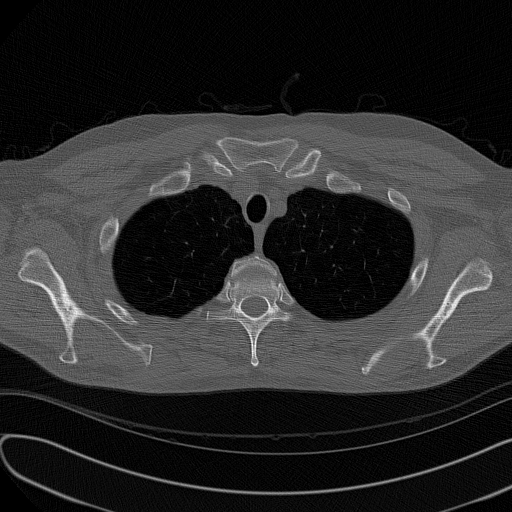

this is an example from the test data after preprocessing



********************************************************